# Partie 1 : Filtrage spatial
## Manipulation 1 : Réduction du bruit
### Importation des packages 

In [2]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
import cmath as math
import numpy
import random
import os

### Lecture et affichage du fichier **isabelle.bmp**

In [12]:
img2 = cv.imread("images/isabelle.bmp")
img=cv.cvtColor(img2,cv.COLOR_BGR2GRAY)
cv.imshow("image", img)
cv.waitKey(0)

-1

### Rajout d'un bruit gaussien de :  
* Moyenne $m=0$
* Ecart-type $\sigma = 0.01$

In [61]:
# Fonction ajoutant un bruit gaussienne de moyenne et d'écart type définis par l'utilisateur
def bruit(image, moyenne, sigma):
    h,l=image.shape
    gauss=np.array
    gauss = [[random.gauss(moyenne,sigma) for j in range(0,h)] for i in range(0,l)]
    bruit=image+gauss
    for i in range(0,h):
        for j in range(0,l):
            if bruit[i,j]<0:
                bruit[i,j]=0
            elif bruit[i,j]>255:
                bruit[i,j]=255
            else:
                bruit[i,j]=bruit[i,j]
    bruit=np.uint8(bruit)
    return bruit

img_noisy =bruit(img,0,0.01)
img_noisy2 = bruit(img, 0, 5)
print(img_noisy.shape)
cv.imshow("image", img_noisy)
cv.waitKey(0)
cv.destroyAllWindows()

(512, 512)


En affichant l'image bruitée avec un bruit d'écart type $\sigma = 0.01$ on ne remarque pas assez bien le bruit, mais il reste présent, on compare les deux images par la suite (avant et après bruitage) :

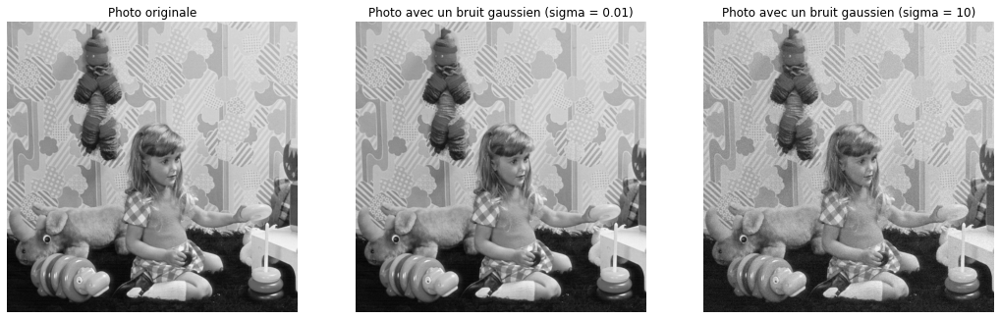

In [62]:
plt.figure(figsize=(18,7))
plt.subplot(1,3,1)
plt.imshow(img, cmap='gray')
plt.title("Photo originale")
plt.axis("off")
plt.subplot(1,3,2)
plt.imshow(img_noisy, cmap='gray')
plt.title("Photo avec un bruit gaussien (sigma = 0.01)")
plt.axis("off")
plt.subplot(1,3,3)
plt.imshow(img_noisy2, cmap='gray')
plt.title("Photo avec un bruit gaussien (sigma = 5)")
plt.axis("off")
plt.show()

On remarque bien avec un écart-type $\sigma = 5$ que le bruit s'est bien mis sur l'image donnant un aspect granuleux à notre image qui est dû à la répartition aléatoire du bruit (suivant une loi gaussienne) sur l'image. On va maintenant appliquer quelques filtres pour voir leurs efficacité contre ce bruit.

### Filtre moyenneur 
#### Application d'un filtre moyenneur 3x3

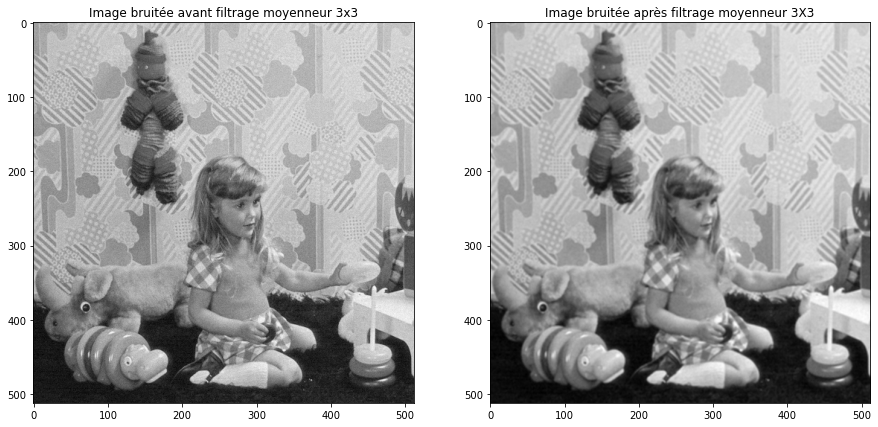

la taille de l'image aprés filtrage moyenneur  est (512, 512)


In [63]:
blur_moy3 = cv.blur(img_noisy2,(3,3))
plt.figure(figsize=(15,7))
plt.subplot(1,2,1)
plt.imshow(img_noisy2,cmap='gray')
plt.title('Image bruitée avant filtrage moyenneur 3x3')
plt.subplot(1,2,2)
plt.imshow(blur_moy3,cmap='gray')
plt.title('Image bruitée après filtrage moyenneur 3X3')
plt.show()
#la taille de l’image obtenue
print("la taille de l'image aprés filtrage moyenneur  est", blur_moy3.shape)

On a utilisé ici l'image la plus bruitée pour qu'on puisse observer l'impact du filtrage, alors on peut faire les remarques suivantes :  
- Le filtre moyen a bien un impact sur le bruit gaussien, il le diminue et cela s'observe car l'effet granuleux a diminué. 
- Par contre, on peut aussi dire que le filtre moyen rajoute un flou à l'image qui est dû à la nature du filtre moyen, qui est un filtre passe-bas communément appelé **filtre de lissage**.  
Les bords sont traités avec la méthode du **miroir**, tels que les cases manquantes sur les bords permettant le calcul de la convolution sont remplacés par symétrie des valeurs dans notre images. La documentation pour retrouver la fonction **cv.blur** est à ce [lien](https://docs.opencv.org/3.4/d4/d86/group__imgproc__filter.html) tels qu'on a le paramètre  : `int 	borderType = BORDER_DEFAULT` est défini comme équivalente à la propriété `BORDER_REFLECT_101 ` qui défini un effet miroir pour les bords




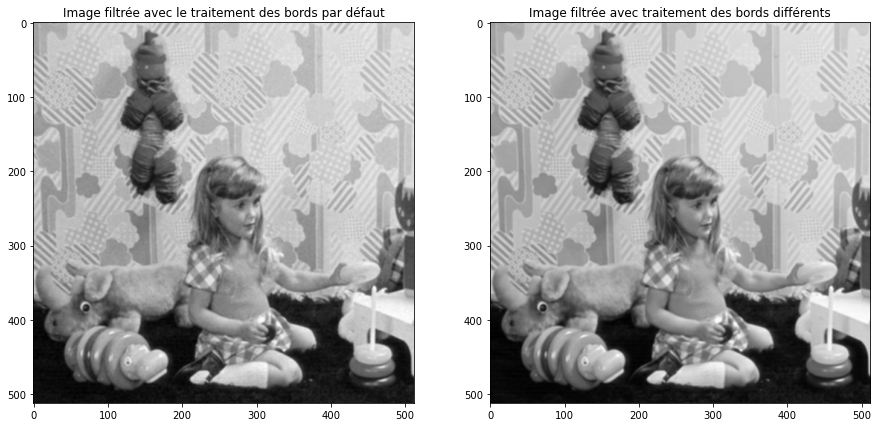

In [64]:
blur_moy3_2 = cv.blur(img_noisy,(3,3),borderType =cv.BORDER_REFLECT)
plt.figure(figsize=(15,7))
plt.subplot(1,2,1)
plt.imshow(blur_moy3,cmap='gray')
plt.title('Image filtrée avec le traitement des bords par défaut')
plt.subplot(1,2,2)
plt.imshow(blur_moy3_2,cmap='gray')
plt.title('Image filtrée avec traitement des bords différents')
plt.show()

On ne remarque pas une différence, ce qui est normal vu les dimensions de notre images, une ligne de pixels est indiscernable à l'oeil nu. 

On soustrait maintenant l'image originale à l'image filtrée pour observer la différence entre les deux

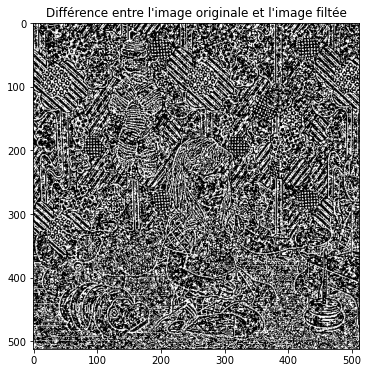

In [65]:
imgsoust3 = img - blur_moy3
plt.figure(figsize=(6,6))
plt.imshow(imgsoust3,cmap='gray')
plt.title("Différence entre l'image originale et l'image filtée")
plt.show()

On voit bien que la différence reste importante entre les deux images et c'est du entre autre au fait que :  
- Le filtre moyenneur n'est pas le filtre le plus adapté au bruit gaussien
- Le flou appliqué aussi augmente la différence avec l'image originale

### On refait la même manipulation mais en utilisant des filtres moyenneurs 5x5 et 7x7
#### Filtre moyenneur 5x5

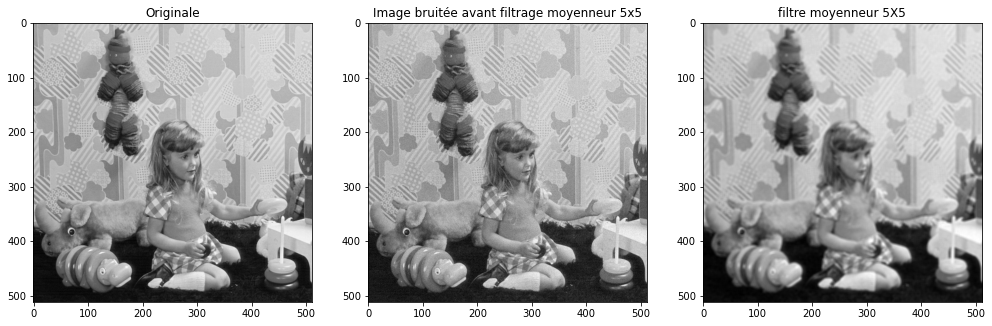

la taille de l'image aprés filtrage moyenneur 5X5 (512, 512)


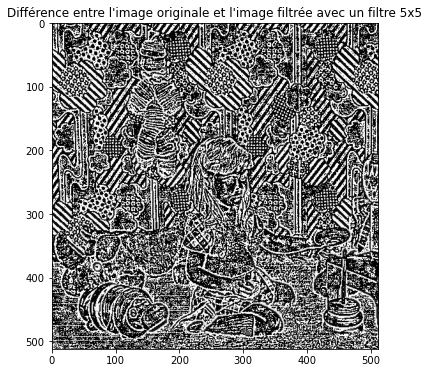

In [68]:
blur_moy5 = cv.blur(img_noisy2,(5,5))
plt.figure(figsize=(17,7))
plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title('Originale')
plt.subplot(1,3,2)
plt.imshow(img_noisy2,cmap='gray')
plt.title('Image bruitée avant filtrage moyenneur 5x5')
plt.subplot(1,3,3)
plt.imshow(blur_moy5,cmap='gray')
plt.title('filtre moyenneur 5X5')
plt.show()
print("la taille de l'image aprés filtrage moyenneur 5X5", blur_moy5.shape)
imgsoust5 = img - blur_moy5
plt.figure(figsize=(6,6))
plt.imshow(imgsoust5,cmap='gray')
plt.title("Différence entre l'image originale et l'image filtrée avec un filtre 5x5")
plt.show()

On voit avec ces premier résultat : 
- Le filtre moyenneur 5x5 est plus efficace contre le bruit gaussien (le diminue encore plus) et cela s'observe en faisant la différence entre l'image originale et l'image filtrée et en la comparant avec le résultat retrouvé avec un filtrage 3x3
- Mais en contre partie il applique un plus grand flou et donc on perd en détails.
#### Avec le filtre 7x7

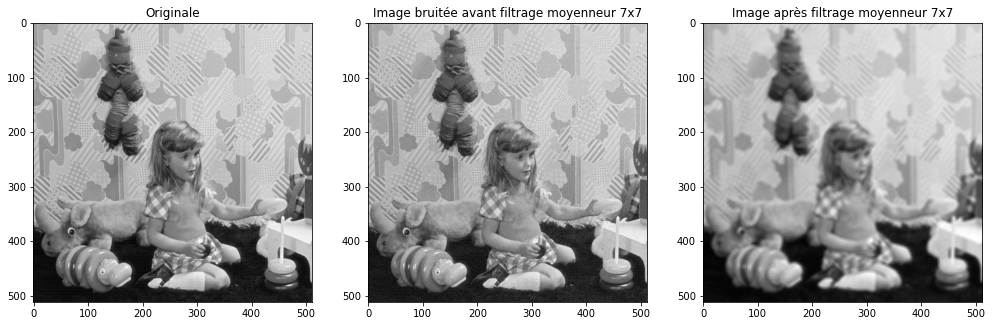

la taille de limage aprés filtrage moyenneur 7X7  (512, 512)


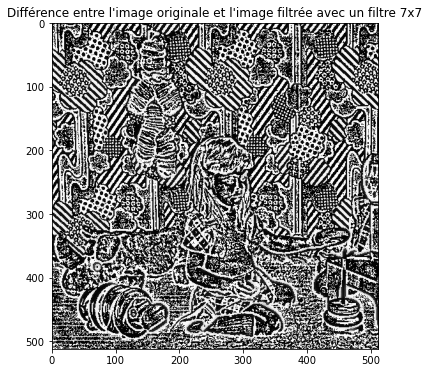

In [71]:
blur_moy7 = cv.blur(img_noisy2,(7,7))
plt.figure(figsize=(17,7))
plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title('Originale')
plt.subplot(1,3,2)
plt.imshow(img_noisy2,cmap='gray')
plt.title('Image bruitée avant filtrage moyenneur 7x7')
plt.subplot(1,3,3)
plt.imshow(blur_moy7,cmap='gray')
plt.title('Image après filtrage moyenneur 7x7')
plt.show()
print('la taille de l''image aprés filtrage moyenneur 7X7 ', blur_moy7.shape)
imgsoust7 = img - blur_moy7
plt.figure(figsize=(6,6))
plt.imshow(imgsoust7,cmap='gray')
plt.title("Différence entre l'image originale et l'image filtrée avec un filtre 7x7")
plt.show()

On peut refaire les mêmes remarques que précédemment et on voit bien que la nature du filtre moyenne (filtre passe-bas) applique effectivement un flou sur l'image nous faisant perdre en détails. Et par conséquent ce n'est pas le choix le plus judicieux pour diminuer efficacement les bruits gaussiens sur des images. 

### Filtre gaussien
Ainsi on applique un filtre gaussien de taille 3x3 et d'écart-type $\sigma = 1$

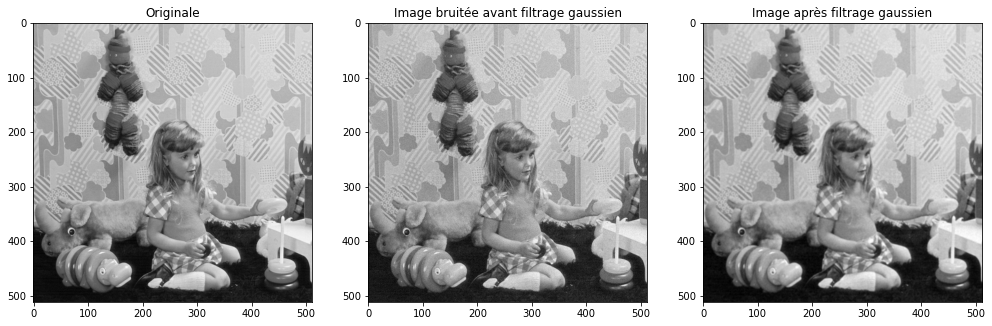

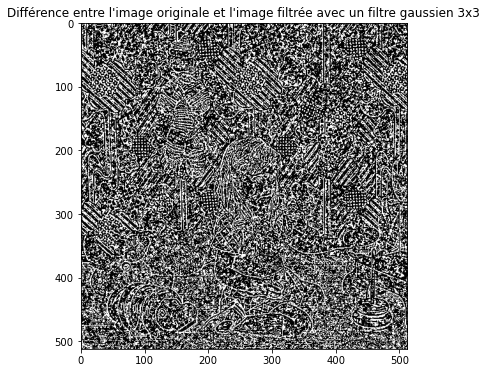

In [72]:
blur_gauss3 = cv.GaussianBlur(img_noisy2,(3,3),1)
plt.figure(figsize=(17,7))
plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title('Originale')
plt.subplot(1,3,2)
plt.imshow(img_noisy2,cmap='gray')
plt.title('Image bruitée avant filtrage gaussien')
plt.subplot(1,3,3)
plt.imshow(blur_gauss3,cmap='gray')
plt.title('Image après filtrage gaussien')
plt.show()
imgsoustgauss3 = img - blur_gauss3
plt.figure(figsize=(6,6))
plt.imshow(imgsoustgauss3,cmap='gray')
plt.title("Différence entre l'image originale et l'image filtrée avec un filtre gaussien 3x3")
plt.show()

On observe bien que le filtre gaussien est bien efficace que le filtre moyenneur tels que : 
- On observe en comparant les trois images que le filtre diminue énormémément le bruit gaussien 
- Il applique moins de flou que le filtre moyenneur
- On observe aussi avec la soustraction des deux images que le résultat est plus proche de l'image originale (présence plus importante de noir indiquant une différence nulle)

#### Etude de l'impact de la taille du filtre gaussien

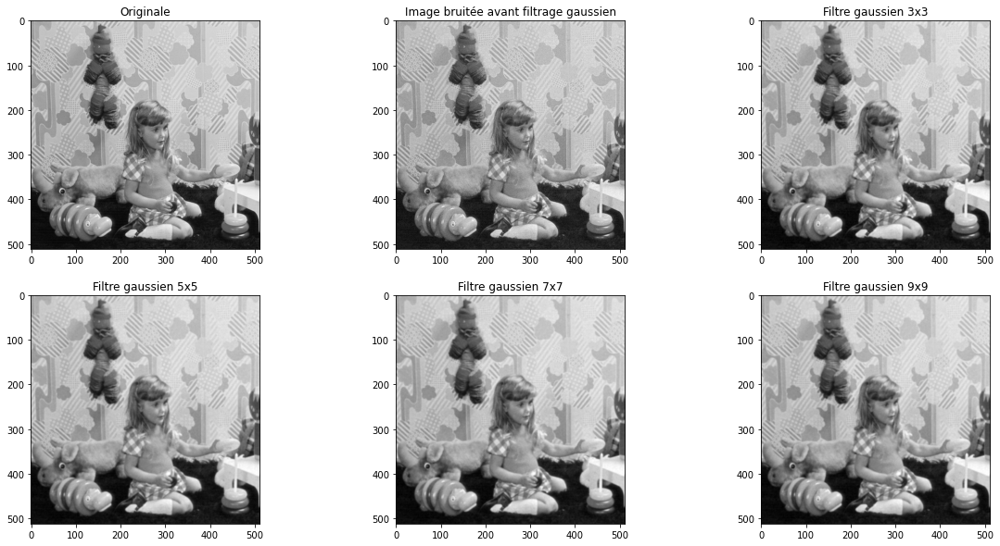

In [79]:
blur_gauss3 = cv.GaussianBlur(img_noisy2,(3,3),1)
blur_gauss5 = cv.GaussianBlur(img_noisy2,(5,5),1)
blur_gauss7 = cv.GaussianBlur(img_noisy2,(7,7),1)
blur_gauss9 = cv.GaussianBlur(img_noisy2,(9,9),1)
plt.figure(figsize=(20,10))
plt.subplot(2,3,1)
plt.imshow(img,cmap='gray')
plt.title('Originale')
plt.subplot(2,3,2)
plt.imshow(img_noisy2,cmap='gray')
plt.title('Image bruitée avant filtrage gaussien')
plt.subplot(2,3,3)
plt.imshow(blur_gauss3,cmap='gray')
plt.title('Filtre gaussien 3x3')
plt.subplot(2,3,4)
plt.imshow(blur_gauss5,cmap='gray')
plt.title('Filtre gaussien 5x5')
plt.subplot(2,3,5)
plt.imshow(blur_gauss7,cmap='gray')
plt.title('Filtre gaussien 7x7')
plt.subplot(2,3,6)
plt.imshow(blur_gauss9,cmap='gray')
plt.title('Filtre gaussien 9x9')
plt.show()
#imgsoustgauss3 = img - blur_gauss3
#imgsoustgauss5 = img - blur_gauss5
#imgsoustgauss7 = img - blur_gauss7
#imgsoustgauss9 = img - blur_gauss9

On voit bien qu'en augmentant la taille du filtre le flou sur l'image augmente. Observons maintenant l'impact de l'écart-type
#### Etude de l'impact de l'écart-type du filtre gaussien

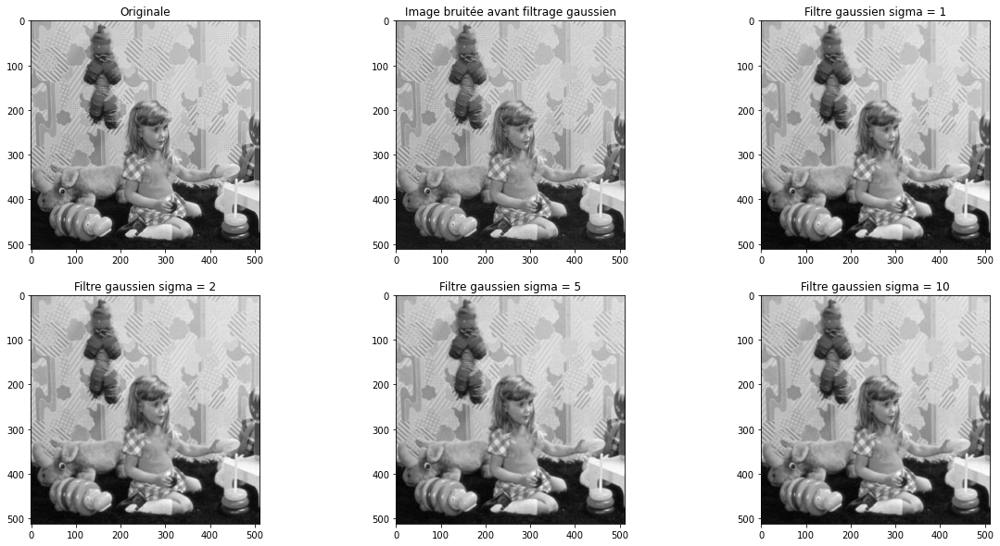

In [83]:
blur_gauss3 = cv.GaussianBlur(img_noisy2,(3,3),1)
blur_gauss3_2 = cv.GaussianBlur(img_noisy2,(3,3),2)
blur_gauss3_5 = cv.GaussianBlur(img_noisy2,(3,3),5)
blur_gauss3_10 = cv.GaussianBlur(img_noisy2,(3,3),10)
plt.figure(figsize=(20,10))
plt.subplot(2,3,1)
plt.imshow(img,cmap='gray')
plt.title('Originale')
plt.subplot(2,3,2)
plt.imshow(img_noisy2,cmap='gray')
plt.title('Image bruitée avant filtrage gaussien')
plt.subplot(2,3,3)
plt.imshow(blur_gauss3,cmap='gray')
plt.title('Filtre gaussien sigma = 1')
plt.subplot(2,3,4)
plt.imshow(blur_gauss3_2,cmap='gray')
plt.title('Filtre gaussien sigma = 2')
plt.subplot(2,3,5)
plt.imshow(blur_gauss3_5,cmap='gray')
plt.title('Filtre gaussien sigma = 5')
plt.subplot(2,3,6)
plt.imshow(blur_gauss3_10,cmap='gray')
plt.title('Filtre gaussien sigma = 10')
plt.show()

On remarque bien que l'efficacité du filtre dépend de la différence entre l'écart-type du bruit gaussien et l'écart-type du filtre appliqué. Tels qu'on observe bien que dans notre cas ayant un bruit gaussien d'écart-type 5, le meilleur filtrage 3x3 est celui avec un écart-type de 5 aussi. Alors en recoupant les deux informations on a vu dans la taille que le meilleur était celui de taille 3x3 (appliquant le moins de flou à l'image) et pour l'écart-type celui avec une valeur de 5, alors on le calcule et on voit la différence avec l'image originale. 

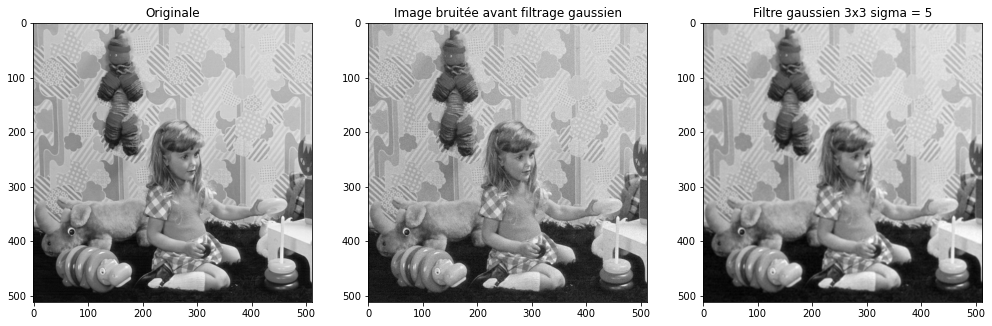

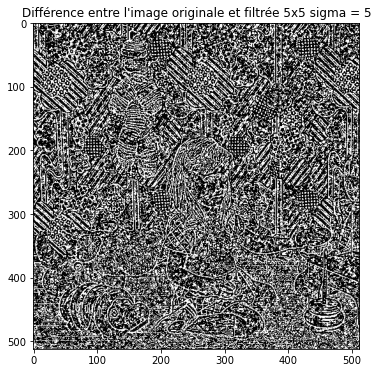

In [92]:
blur_gauss5_5 = cv.GaussianBlur(img_noisy2,(5,5),5)

plt.figure(figsize=(17,7))
plt.subplot(1,3,1)
plt.imshow(img,cmap='gray')
plt.title('Originale')
plt.subplot(1,3,2)
plt.imshow(img_noisy2,cmap='gray')
plt.title('Image bruitée avant filtrage gaussien')
plt.subplot(1,3,3)
plt.imshow(blur_gauss3_5,cmap='gray')
plt.title('Filtre gaussien 3x3 sigma = 5')
imgsoustgauss3_5 = img - blur_gauss3_5
plt.figure(figsize=(6,6))
plt.imshow(imgsoustgauss3_5,cmap='gray')
plt.title("Différence entre l'image originale et filtrée 5x5 sigma = 5")
plt.show()

Effectivement on voit bien que la différence entre les deux images (originale et après filtrage) est assez efficace, bien plus que le filtre moyenneur. 

### Filtre médian
On observe l'impact de filtres médians de tailles : 3x3 - 5x5 - 7x7 et 9x9

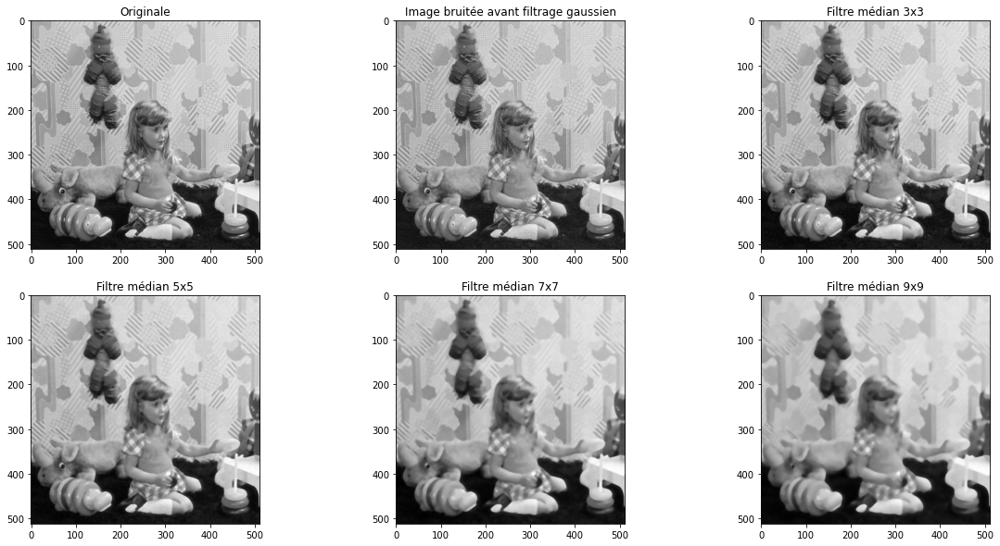

In [95]:
blur_med3 = cv.medianBlur(img_noisy2,3)
blur_med5 = cv.medianBlur(img_noisy2,5)
blur_med7 = cv.medianBlur(img_noisy2,7)
blur_med9 = cv.medianBlur(img_noisy2,9)
plt.figure(figsize=(20,10))
plt.subplot(2,3,1)
plt.imshow(img,cmap='gray')
plt.title('Originale')
plt.subplot(2,3,2)
plt.imshow(img_noisy2,cmap='gray')
plt.title('Image bruitée avant filtrage gaussien')
plt.subplot(2,3,3)
plt.imshow(blur_med3,cmap='gray')
plt.title('Filtre médian 3x3')
plt.subplot(2,3,4)
plt.imshow(blur_med5,cmap='gray')
plt.title('Filtre médian 5x5')
plt.subplot(2,3,5)
plt.imshow(blur_med7,cmap='gray')
plt.title('Filtre médian 7x7')
plt.subplot(2,3,6)
plt.imshow(blur_med9,cmap='gray')
plt.title('Filtre médian 9x9')
plt.show()

On voit bien que le filtre médian n'est pas optimisé pour les bruits gaussiens, il applique énormément de flou et avec une observation rapide, le plus efficace reste celui avec une taille 3x3, on va voir la différence avec l'image originale :

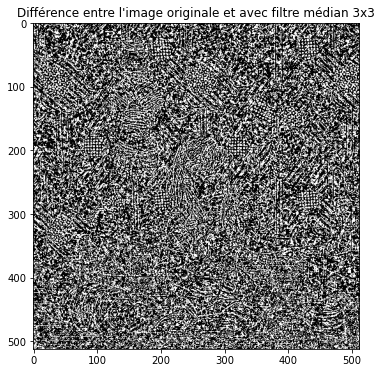

In [97]:
imgsoustmed3 = img - blur_med3
plt.figure(figsize=(6,6))
plt.imshow(imgsoustmed3,cmap='gray')
plt.title("Différence entre l'image originale et avec filtre médian 3x3")
plt.show()

Le filtre médian reste plus efficace que le filtre moyenneur mais bien moins efficace que le filtre gaussien
## Comparaison des trois filtres
Après l'étude précédente, sur un bruit gaussien il est clair que le filtre le plus efficace reste le filtre gaussien avec un écart-type au plus proche de celui du bruit, impactant ainsi un maximum la répartition du bruit et appliquant le moins possible de bruit avec des tailles de filtres assez faibles. 
## Etude des filtres sur un bruit impulsionnel 0.1
### On applique un bruit impulsionnel sur notre image

<ipython-input-100-b1803e3cfcf7>:9: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out[coords] = 255
<ipython-input-100-b1803e3cfcf7>:15: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out[coords] = 0


Text(0.5, 1.0, 'Image avec bruit impulsionnel 0.1')

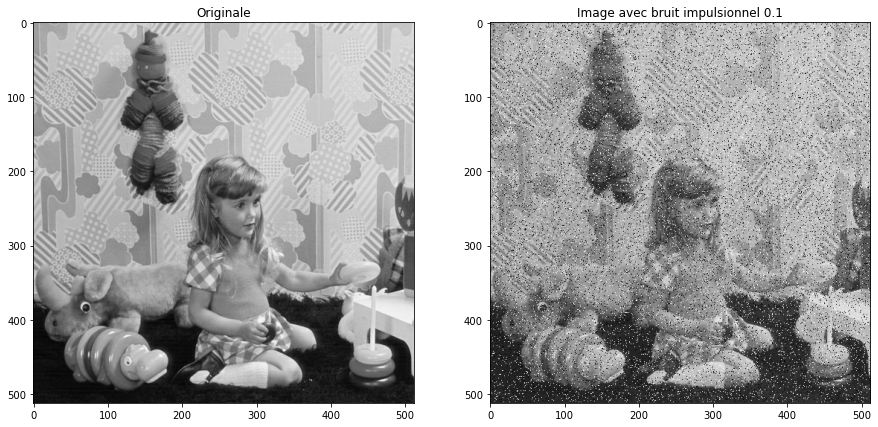

In [100]:
def impulse(image,amount):
    row,col = image.shape
    s_vs_p = 0.5
    out = np.copy(image)
    # Salt mode
    num_salt = np.ceil(amount * image.size * s_vs_p)
    coords = [np.random.randint(0, i - 1, int(num_salt))
            for i in image.shape]
    out[coords] = 255

    # Pepper mode
    num_pepper = np.ceil(amount* image.size * (1. - s_vs_p))
    coords = [np.random.randint(0, i - 1, int(num_pepper))
            for i in image.shape]
    out[coords] = 0
    return out
imgB_imp=impulse(img,0.1)

# Affichage des images
plt.figure(figsize=(15,7))
plt.subplot(1,2,1)
plt.imshow(img,cmap='gray')
plt.title('Originale')
plt.subplot(1,2,2)
plt.imshow(imgB_imp,cmap='gray')
plt.title('Image avec bruit impulsionnel 0.1')
plt.show()

On observe effectivement un bruit impulsionnel sur notre image : des pixels remplacés par des pixels blancs ou noirs aléatoirement, on applique maintenant sur cette image les filtres : 
- moyen 5x5
- gaussien 5x5 $\sigma = 1$
- médian 5x5

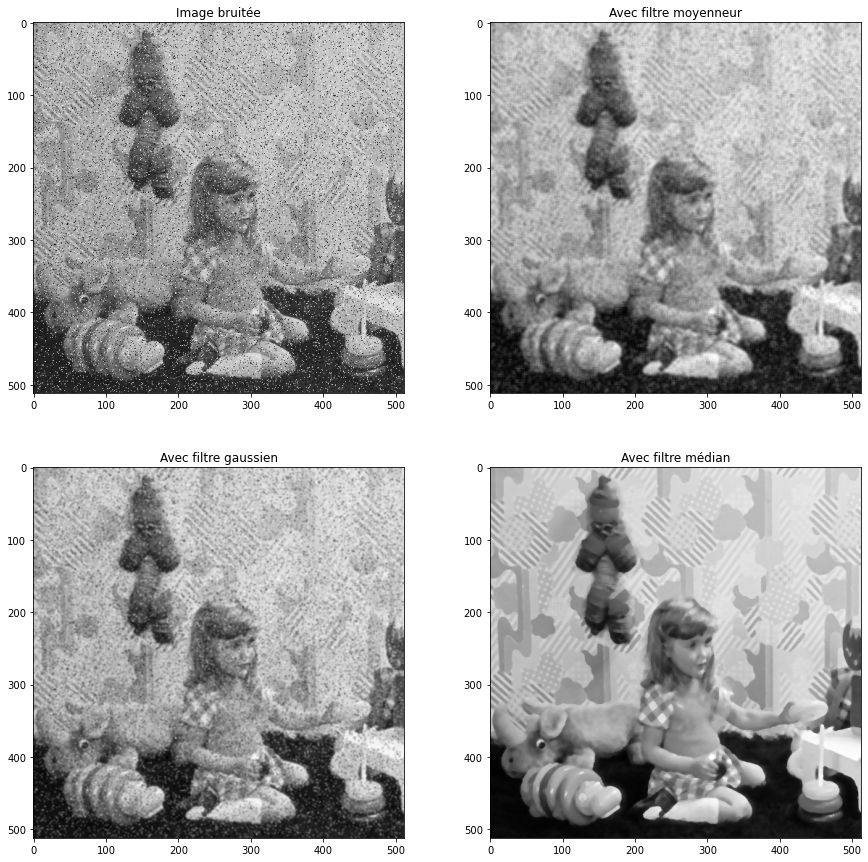

In [102]:
blur_moy2 = cv.blur(imgB_imp,(5,5))
blur_gauss2 = cv.GaussianBlur(imgB_imp,(5,5),1)
median2=cv.medianBlur(imgB_imp,5)

plt.figure(figsize=(15,15))
plt.subplot(2,2,1)
plt.imshow(imgB_imp,cmap='gray')
plt.title('Image bruitée')
plt.subplot(2,2,2)
plt.imshow(blur_moy2,cmap='gray')
plt.title('Avec filtre moyenneur')
plt.subplot(2,2,3)
plt.imshow(blur_gauss2,cmap='gray')
plt.title('Avec filtre gaussien')
plt.subplot(2,2,4)
plt.imshow(median2,cmap='gray')
plt.title('Avec filtre médian')
plt.show()

Le résultat est bien clair ici, le filtre le plus efficace contre le bruit impulsionnel est bien le filtre médian, on voit effectivement qu'il enlève complètement le bruit poivre et sel de notre image et cela est dû à sa structure qui est de remplacer les pixels par la médianne de son entourage et par conséquent il élimine les valeurs extrêmes ammenées par le bruit impulsionnel. Maintenant en augmentant le taux de remplacement dans le bruit impulsionnel on verra que le filtre médian ne peut plus tout remplacer. 

<ipython-input-100-b1803e3cfcf7>:9: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out[coords] = 255
<ipython-input-100-b1803e3cfcf7>:15: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out[coords] = 0


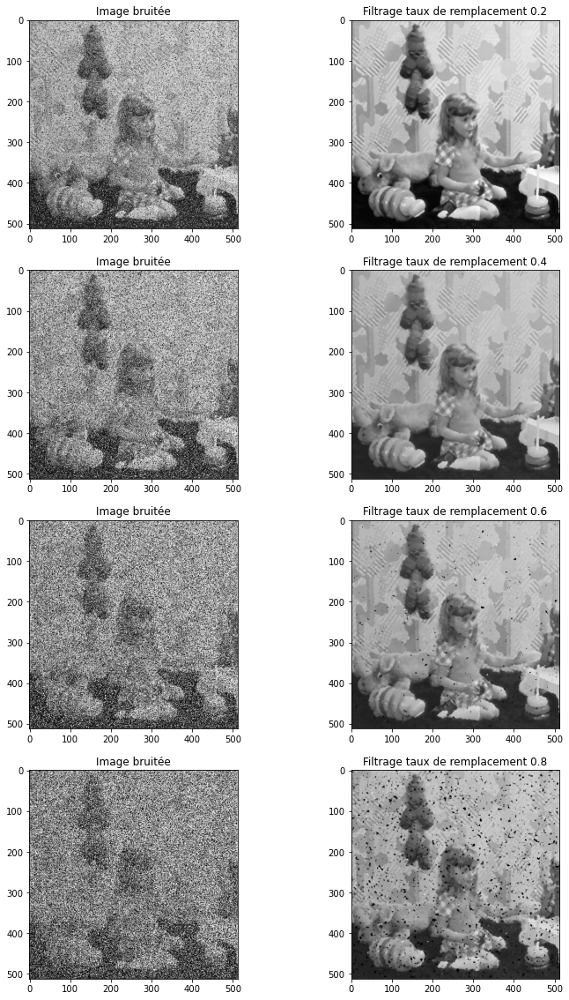

In [111]:
imgB_imp2=impulse(img,0.2)
imgB_imp4=impulse(img,0.4)
imgB_imp6=impulse(img,0.6)
imgB_imp8=impulse(img,0.8)
median5_02=cv.medianBlur(imgB_imp2,5)
median5_04=cv.medianBlur(imgB_imp4,5)
median5_06=cv.medianBlur(imgB_imp6,5)
median5_08=cv.medianBlur(imgB_imp8,5)
plt.figure(figsize=(12,20))
plt.subplot(4,2,1)
plt.imshow(imgB_imp2,cmap='gray')
plt.title('Image bruitée')
plt.subplot(4,2,2)
plt.imshow(median5_02,cmap='gray')
plt.title('Filtrage taux de remplacement 0.2')
plt.subplot(4,2,3)
plt.imshow(imgB_imp4,cmap='gray')
plt.title('Image bruitée')
plt.subplot(4,2,4)
plt.imshow(median5_04,cmap='gray')
plt.title('Filtrage taux de remplacement 0.4')
plt.subplot(4,2,5)
plt.imshow(imgB_imp6,cmap='gray')
plt.title('Image bruitée')
plt.subplot(4,2,6)
plt.imshow(median5_06,cmap='gray')
plt.title('Filtrage taux de remplacement 0.6')
plt.subplot(4,2,7)
plt.imshow(imgB_imp8,cmap='gray')
plt.title('Image bruitée')
plt.subplot(4,2,8)
plt.imshow(median5_08,cmap='gray')
plt.title('Filtrage taux de remplacement 0.8')
plt.show()

On voit qu'à partir d'un taux de remplaxement de remplacement de 0.6 le filtre ne peut plus bien filtrer le bruit impulsionnel, et cela s'explique aussi par la nature du filtre, si l'entourage d'un point bruité est aussi bruité il y a de forte chance que la médianne est une valeur extrême et par conséquent le filtre n'a aucune influence sur le bruit présent. Donc on se limite pour ce filtre médian à une limite de 0.6 maximale.

## Manipulation 2 : Détection de contours 
### Lecture, affichage et transformation en niveaux de gris de l'image **lena.png**

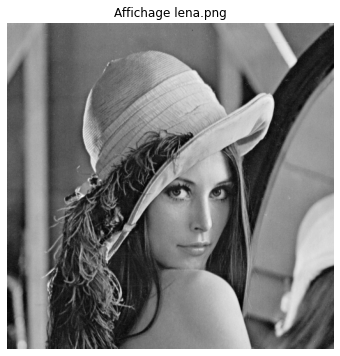

In [5]:
lena = cv.imread("images/lena.png")
lena=cv.cvtColor(lena,cv.COLOR_BGR2GRAY)

plt.figure(figsize=(6,6))
plt.imshow(lena, cmap='gray')
plt.title("Affichage lena.png")
plt.axis("off")
plt.show()

### Utilisation des filtres de détection de contour : Prewitt - Robert - Sobel
#### Prewitt
On va calculer les kernels du filtre de Prewitt et afficher l'effet du gradient suivant les lignes et suivants les colonnes

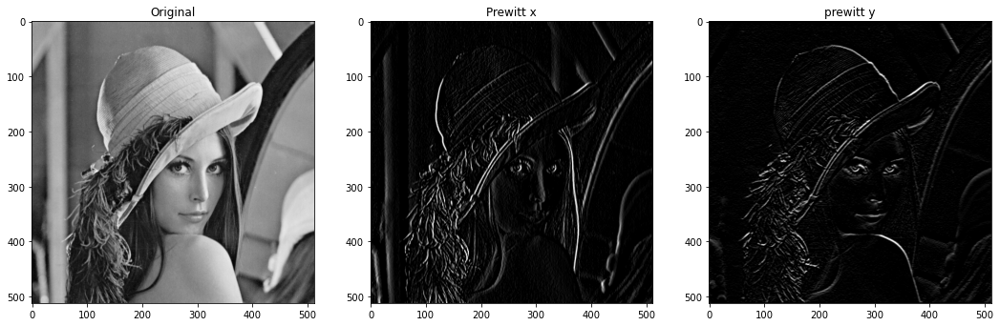

In [6]:
# Les deux kernels du filtre de Prewitt : horizontal et vertical
kernel_px = np.array([
    [-1,0,1],
    [-1,0,1],
    [-1,0,1]])
kernel_py = np.array([
    [-1,-1,-1],
    [0,0,0],
    [1,1,1]])
# On applique les deux filtres sur l'image
prewittx = cv.filter2D(lena, -1, kernel_px)
prewitty = cv.filter2D(lena, -1, kernel_py)

plt.figure(figsize=(18,7))
plt.subplot(1,3,1)
plt.imshow(lena,cmap = 'gray')
plt.title('Original')

plt.subplot(1,3,2)
plt.imshow(prewittx,cmap = 'gray')
plt.title('Prewitt x')

plt.subplot(1,3,3)
plt.imshow(prewitty,cmap = 'gray')
plt.title('prewitt y')
plt.show()

On affiche maintenant le module et la phase du filtrage de Prewitt

<ipython-input-12-f54dce1eaeed>:4: RuntimeWarning: divide by zero encountered in true_divide
  phase_prewitt=np.arctan(prewitty/prewittx)
<ipython-input-12-f54dce1eaeed>:4: RuntimeWarning: invalid value encountered in true_divide
  phase_prewitt=np.arctan(prewitty/prewittx)


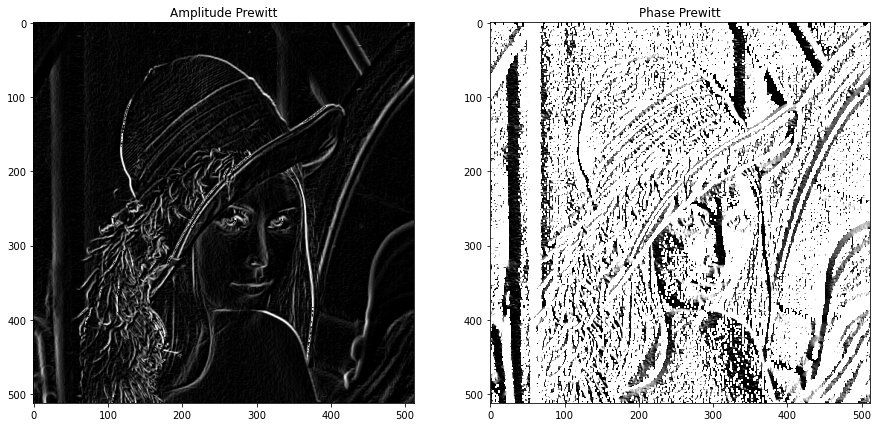

In [12]:
amp_prewitt_carre=np.square(prewittx.astype(np.float32))+np.square(prewitty.astype(np.float32))
amp_prewitt=np.sqrt(amp_prewitt_carre)
amp_prewitt=np.uint8(amp_prewitt)
phase_prewitt=np.arctan(prewitty/prewittx)

plt.figure(figsize=(15,7))
plt.subplot(1,2,1)
plt.imshow(amp_prewitt,cmap = 'gray')
plt.title('Amplitude Prewitt') 

plt.subplot(1,2,2)
plt.imshow(phase_prewitt,cmap = 'gray')
plt.title('Phase Prewitt')
plt.show()

#### Sobel 
On fait comme avec le filtre de Prewitt on commence par le calcul des kernels et l'application sur l'image et par la suite le calcul de la phase et du module

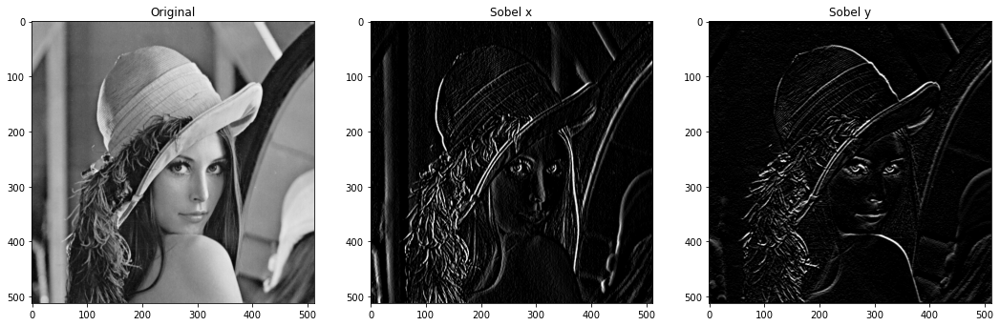

<ipython-input-10-782f4eab8ebb>:31: RuntimeWarning: divide by zero encountered in true_divide
  phase_sobel=np.arctan(sobely/sobelx)
<ipython-input-10-782f4eab8ebb>:31: RuntimeWarning: invalid value encountered in true_divide
  phase_sobel=np.arctan(sobely/sobelx)


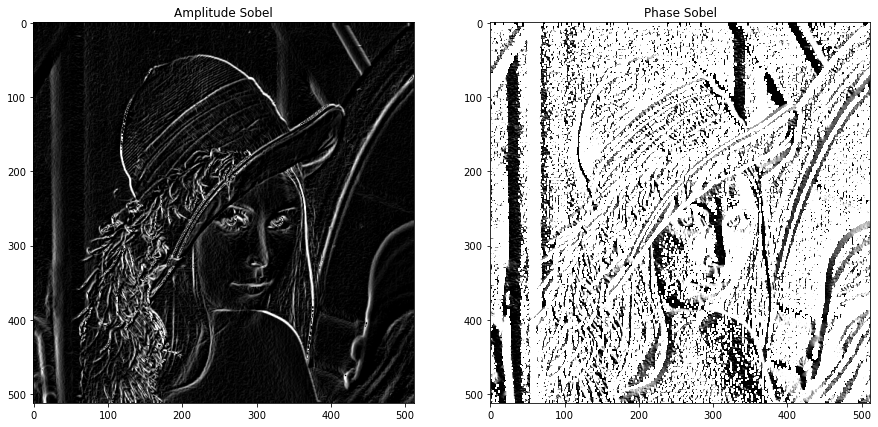

In [10]:
kernelxs = np.array([
    [-1,0,1],
    [-2,0,2],
    [-1,0,1]])
kernelys = np.array([
    [-1,-2,-1],
    [0,0,0],
    [1,2,1]])

sobelx = cv.filter2D(lena, -1, kernelxs)
sobely = cv.filter2D(lena, -1, kernelys)

plt.figure(figsize=(18,7))
plt.subplot(1,3,1)
plt.imshow(lena,cmap = 'gray')
plt.title('Original')

plt.subplot(1,3,2)
plt.imshow(sobelx,cmap = 'gray')
plt.title('Sobel x')

plt.subplot(1,3,3)
plt.imshow(sobely,cmap = 'gray')
plt.title('Sobel y')
plt.show()

# Calcul du module et de la phase du filtrage par Sobel
amp_sobel_carre=np.square(sobelx.astype(np.float32))+np.square(sobely.astype(np.float32))
amp_sobel=np.sqrt(amp_sobel_carre)
amp_sobel=np.uint8(amp_sobel)
phase_sobel=np.arctan(sobely/sobelx)

plt.figure(figsize=(15,7))
plt.subplot(1,2,1)
plt.imshow(amp_sobel,cmap = 'gray')
plt.title('Amplitude Sobel')

plt.subplot(1,2,2)
plt.imshow(phase_sobel,cmap = 'gray')
plt.title('Phase Sobel')
plt.show()

#### Robert

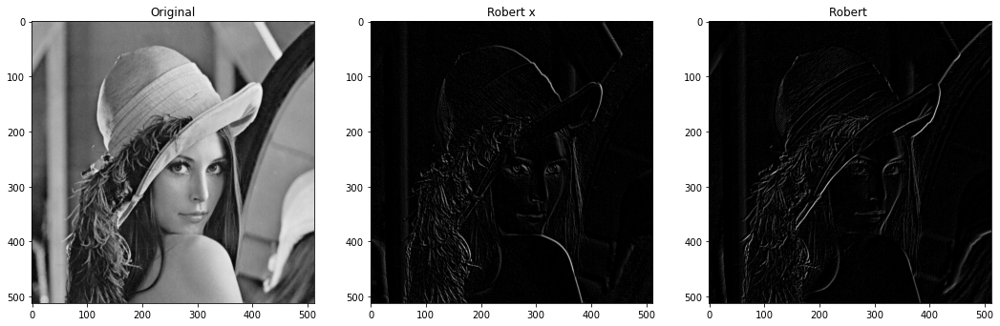

<ipython-input-21-3217a3007b36>:29: RuntimeWarning: divide by zero encountered in true_divide
  phase_robert=np.arctan(roberty/robertx)
<ipython-input-21-3217a3007b36>:29: RuntimeWarning: invalid value encountered in true_divide
  phase_robert=np.arctan(roberty/robertx)


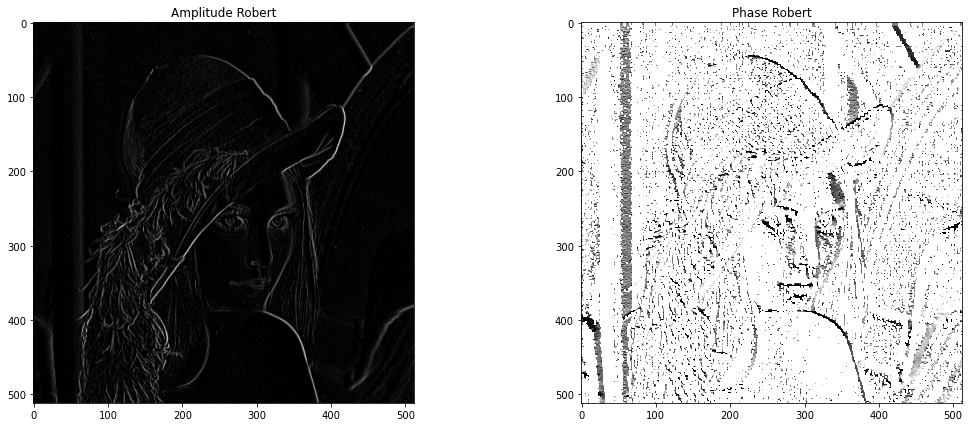

In [21]:
kernelxr = np.array([
    [0,-1],
    [1,0]])
kernelyr = np.array([
    [1,0],
    [0,-1]])
robertx = cv.filter2D(lena, -1, kernelxr)
roberty = cv.filter2D(lena, -1, kernelyr)

plt.figure(figsize=(18,7))
plt.subplot(1,3,1)
plt.imshow(lena,cmap = 'gray')
plt.title('Original')

plt.subplot(1,3,2)
plt.imshow(robertx,cmap = 'gray')
plt.title('Robert x')

plt.subplot(1,3,3)
plt.imshow(roberty,cmap = 'gray')
plt.title('Robert ')

plt.show()

# Calcul du module et de la phase
amp_robert_carre=np.square(robertx.astype(np.float32))+np.square(roberty.astype(np.float32))
amp_robert=np.sqrt(amp_robert_carre)
amp_robert=np.uint8(amp_robert)
phase_robert=np.arctan(roberty/robertx)

plt.figure(figsize=(18,7))
plt.subplot(1,2,1)
plt.imshow(amp_robert,cmap = 'gray')
plt.title('Amplitude Robert')

plt.subplot(1,2,2)
plt.imshow(phase_robert,cmap = 'gray')
plt.title('Phase Robert')

plt.show()

#### Comparaison entre les différents opérateurs

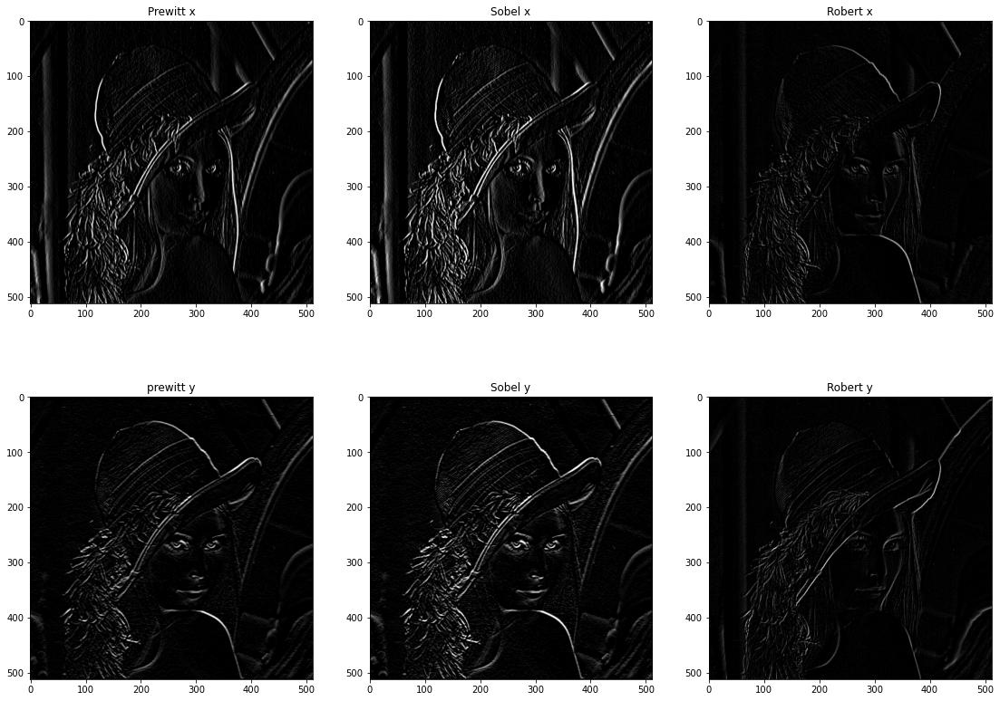

In [17]:
plt.figure(figsize=(19,14))

plt.subplot(2,3,1)
plt.imshow(prewittx,cmap = 'gray')
plt.title('Prewitt x')

plt.subplot(2,3,2)
plt.imshow(sobelx,cmap = 'gray')
plt.title('Sobel x')

plt.subplot(2,3,3)
plt.imshow(robertx,cmap = 'gray')
plt.title('Robert x')

plt.subplot(2,3,4)
plt.imshow(prewitty,cmap = 'gray')
plt.title('prewitt y')

plt.subplot(2,3,5)
plt.imshow(sobely,cmap = 'gray')
plt.title('Sobel y')

plt.subplot(2,3,6)
plt.imshow(roberty,cmap = 'gray')
plt.title('Robert y')

plt.show()

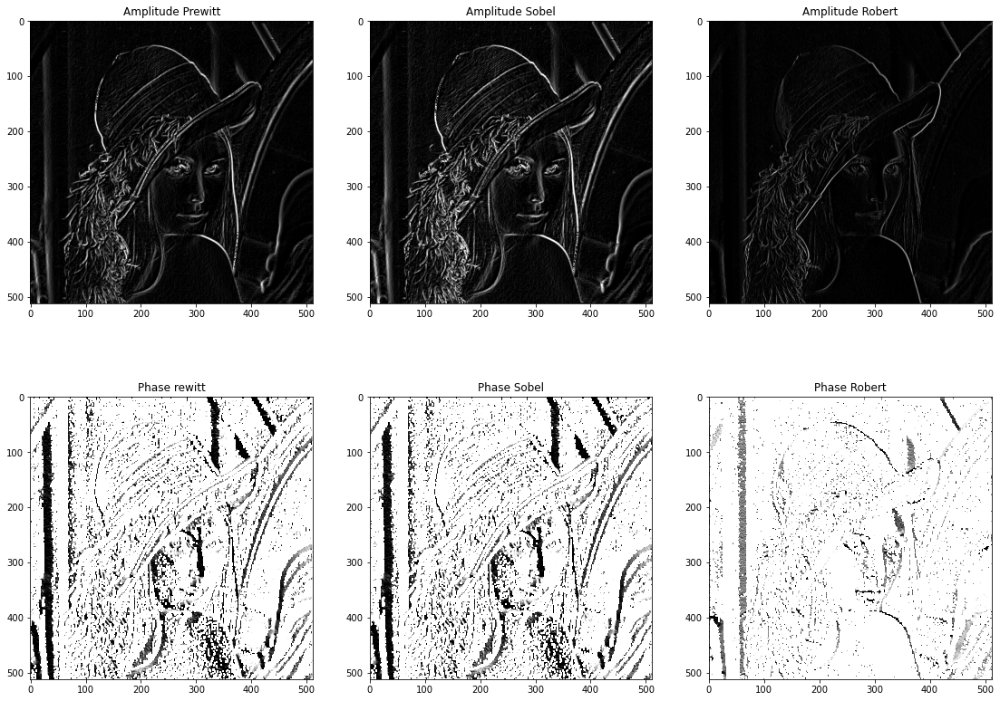

In [22]:
plt.figure(figsize=(19,14))

plt.subplot(2,3,1)
plt.imshow(amp_prewitt,cmap = 'gray')
plt.title('Amplitude Prewitt')

plt.subplot(2,3,2)
plt.imshow(amp_sobel,cmap = 'gray')
plt.title('Amplitude Sobel')

plt.subplot(2,3,3)
plt.imshow(amp_robert,cmap = 'gray')
plt.title('Amplitude Robert')

plt.subplot(2,3,4)
plt.imshow(phase_prewitt,cmap = 'gray')
plt.title('Phase rewitt')

plt.subplot(2,3,5)
plt.imshow(phase_sobel,cmap = 'gray')
plt.title('Phase Sobel')

plt.subplot(2,3,6)
plt.imshow(phase_robert,cmap = 'gray')
plt.title('Phase Robert')

plt.show()

Le module étant l'application des deux kernels du filtre sur l'image et donnant ainsi le résultat de la détection de contours final on peut donner quelques remarques : 
- On observe qu'au niveau des filtres de Prewitt et Sobel ils ont un comportement de filtres passe-bas, ils appliquent un flou à l'image.
- Etant des filtres passe-haut de nature les filtres de Sobel et de Prewitt sont sensibles au bruit. 
- On remarque que la détection des contours est légérement meilleure en utilisant Sobel que Prewitt mais en contre partie, on a des contours plus épais avec Sobel et une plus grande sensibilité au bruit. 
- Au niveau des trois filtres on a un problème d'intégrité des contours, ils ne sont pas continus. 
- La détection des contours en utilisant Robert est bonne, il est moins sensible au bruit et donne des contours assez fins, mais il ne détecte pas la totalité des contours. 

En conclusion le choix se portera sur le filtre de Prewitt ou de Sobel, ils détectent assez bien les contours, un pré-traitement (par filtrage) résoudrai grandement leur sensibilités au bruit. On pencherai néanmoins vers un filtre de Sobel car il est d'une meilleure qualité.  

### Etude du filtre Laplacien 4-connexités et 8-connexités
On va afficher le filtrage avec ces filtres Laplacien pour la détection de contours

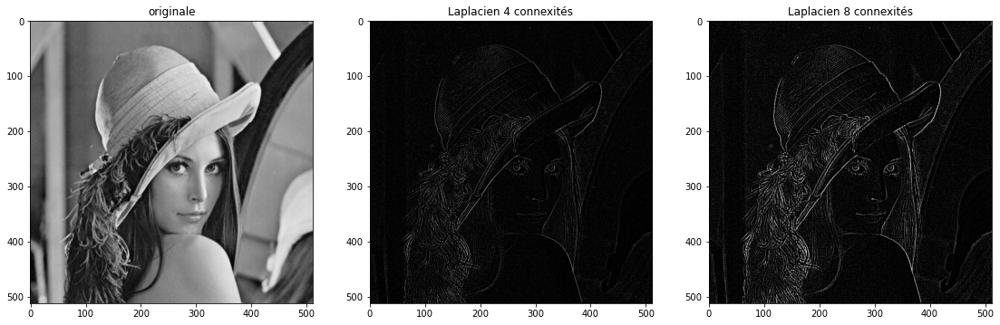

In [23]:
kernel4 = np.array([
    [0,1,0],
    [1,-4,1],
    [0,1,0]])
kernel8 = np.array([
    [1,1,1],
    [1,-8,1],
    [1,1,1]])

laplacien4connex = cv.filter2D(lena, -1, kernel4)
laplacien8connex = cv.filter2D(lena, -1, kernel8)

plt.figure(figsize=(19,7))
plt.subplot(1,3,1)
plt.imshow(lena,cmap = 'gray')
plt.title('originale')

plt.subplot(1,3,2)
plt.imshow(laplacien4connex,cmap = 'gray')
plt.title('Laplacien 4 connexités')

plt.subplot(1,3,3)
plt.imshow(laplacien8connex,cmap = 'gray')
plt.title('Laplacien 8 connexités')

plt.show()

On remarque effectivement que l'utilisation du Laplacien est bien meilleur, les contours sont plus fins et on n'a pas le problème de non intégrité des contours, il est par conséquent meilleur. 

On observe aussi que le Laplacien 8-connexités est meilleur que celui 4-connexités, mais étant un filtre du deuxième ordre, il a un comportement d'un filtre passe haut et par conséquent est extrêmement sensible au bruit et ça se remarque ici surtout au niveau du filtre 8-connexités au niveaux du chapeau, ce qui peut nous donner des faux positifs. Ce problème de sensibilités peut être résolus par deux méthodes : 
- Pré-filtrage (souvent avec un filtre gaussien ou médian)
- Méthode du seuillage

Les deux méthodes on va les aborder dans la prochaine section : 
#### Laplace précédé d'un filtrage gaussien

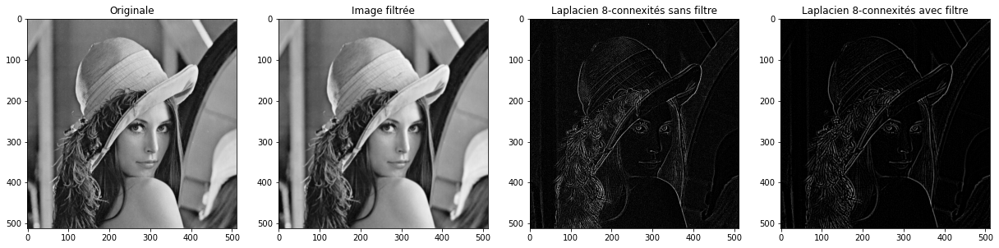

In [24]:
# Application d'un filtre gaussien 3x3 et d'écart-type 1
blur_gauss_lena = cv.GaussianBlur(lena,(3,3),1)
laplacien_gauss_8connex = cv.filter2D(blur_gauss_lena, -1, kernel8)

plt.figure(figsize=(21,7))
plt.subplot(1,4,1)
plt.imshow(lena,cmap = 'gray')
plt.title('Originale')

plt.subplot(1,4,2)
plt.imshow(blur_gauss_lena,cmap = 'gray')
plt.title('Image filtrée')

plt.subplot(1,4,3)
plt.imshow(laplacien8connex,cmap = 'gray')
plt.title('Laplacien 8-connexités sans filtre')

plt.subplot(1,4,4)
plt.imshow(laplacien_gauss_8connex,cmap = 'gray')
plt.title('Laplacien 8-connexités avec filtre')

plt.show()

On observe très bien que la sensibilité au bruit a grandement diminué car il a été quasiment éliminé, ca se remarque effectivement au niveau du chapeau ainsi que des cheveux, qui, sans filtrage, pouvait poser problème, mais avec un filtrage adéquat a été grandement diminué. C'est par conséquent une méthode relativement efficace. Maintenant on essaiera avec la méthode du seuillage et ensuite on les comparera.
#### Laplace avec la méthode du seuillage (A FAIRE)

### Comparaison entre les différents filtres pour la détection de contours

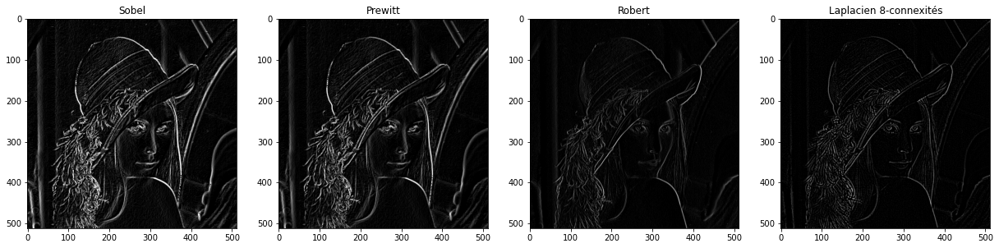

In [25]:
plt.figure(figsize=(21,7))
plt.subplot(1,4,1)
plt.imshow(amp_sobel,cmap = 'gray')
plt.title('Sobel')

plt.subplot(1,4,2)
plt.imshow(amp_prewitt,cmap = 'gray')
plt.title('Prewitt')

plt.subplot(1,4,3)
plt.imshow(amp_robert,cmap = 'gray')
plt.title('Robert')

plt.subplot(1,4,4)
plt.imshow(laplacien_gauss_8connex,cmap = 'gray')
plt.title('Laplacien 8-connexités')

plt.show()

C'est clair avec cette comparaison que le choix le plus judicieux pour la détection de contours dans ce cas est le filtre Laplacien 8-connexités, nous donnant la meilleure détection de contours (épaisseur des contours), en y ajoutant un pré-traitement comme vu précédemment, sa qualité n'en sera que plus grande, et par conséquent faisant de lui le candidat parfait pour la détection de contours. 